# Random Walk

## Import and setup

In [1]:
%load_ext autoreload
%autoreload 2

In [8]:
from src.config import set_seeds
import src.pipeline as pipe
import src.evaluation as eval
import src.models as mod
import src.reporting as rep
import src.visualization as visual
import pandas as pd
import numpy as np
import time
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf

In [5]:
set_seeds()

Random seeds set to 42. Deterministic operations enabled.


## Upload of dataset

In [6]:
df = pipe.load_data()
display(df.head())

Dropped 9 unusable indicators.
Dataset loaded: 65 years (from 1960 to 2024), 27 variables.


,agriland_percent,agriland_abs,exports_percent,imports_percent,valueadded_percent,valueadded_dollars,withdrawals_percent,arableland_percent,arableland_person,arableland_abs,...,fertilizer_abs,food_production_index,forestarea_percent,forestarea_abs,cerealland_abs,livestock_production_index,cropland_percent,population_abs,population_percent,population_growth
1960-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20400656.0,40.639,NaN
1961-01-01,70.324028,206830.0,NaN,NaN,NaN,NaN,NaN,43.731937,0.254510,12862000.0,...,67.795055,85.93,NaN,NaN,6387203.0,70.91,9.336643,20287312.0,40.144,-0.557139
1962-01-01,70.218626,206520.0,2.563660,16.566057,NaN,NaN,NaN,43.504131,0.251477,12795000.0,...,69.362485,86.90,NaN,NaN,6485855.0,72.59,9.435245,20171158.0,39.645,-0.574190
1963-01-01,69.735813,205100.0,2.651714,14.571604,NaN,NaN,NaN,43.092720,0.247288,12674000.0,...,68.764636,86.37,NaN,NaN,6299467.0,65.95,9.319642,20063620.0,39.147,-0.534554
1964-01-01,69.572609,204620.0,2.792923,15.115329,NaN,NaN,NaN,42.834314,0.243791,12598000.0,...,74.639625,90.28,NaN,NaN,6244904.0,69.57,9.438645,19972523.0,38.650,-0.455075



Processing agriland_percent...
Saving results for HIST_MEAN | agriland_percent...
Save complete.
Saving results for NAIVE_LAST | agriland_percent...
Save complete.
Saving results for SEASONAL | agriland_percent...
Save complete.
Saving results for RW_DRIFT | agriland_percent...
Save complete.


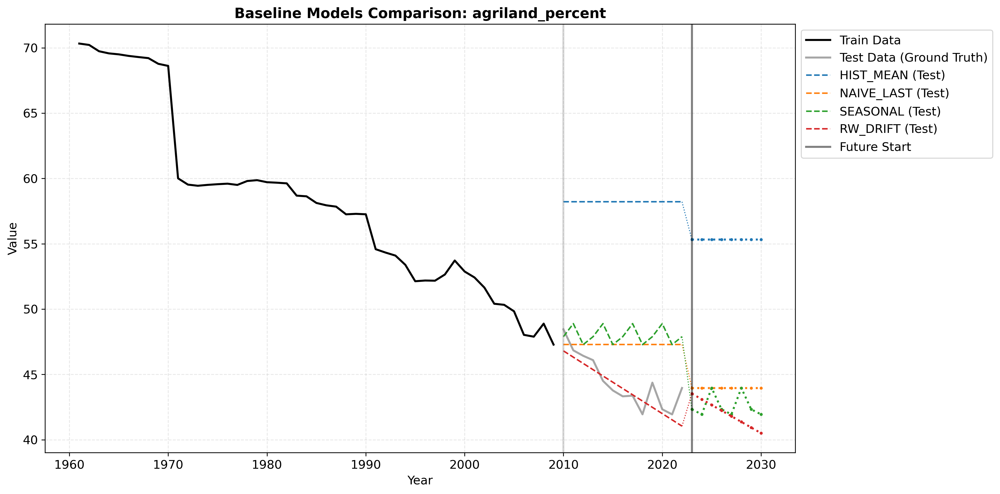


Processing agriland_abs...
Saving results for HIST_MEAN | agriland_abs...
Save complete.
Saving results for NAIVE_LAST | agriland_abs...
Save complete.
Saving results for SEASONAL | agriland_abs...
Save complete.
Saving results for RW_DRIFT | agriland_abs...
Save complete.


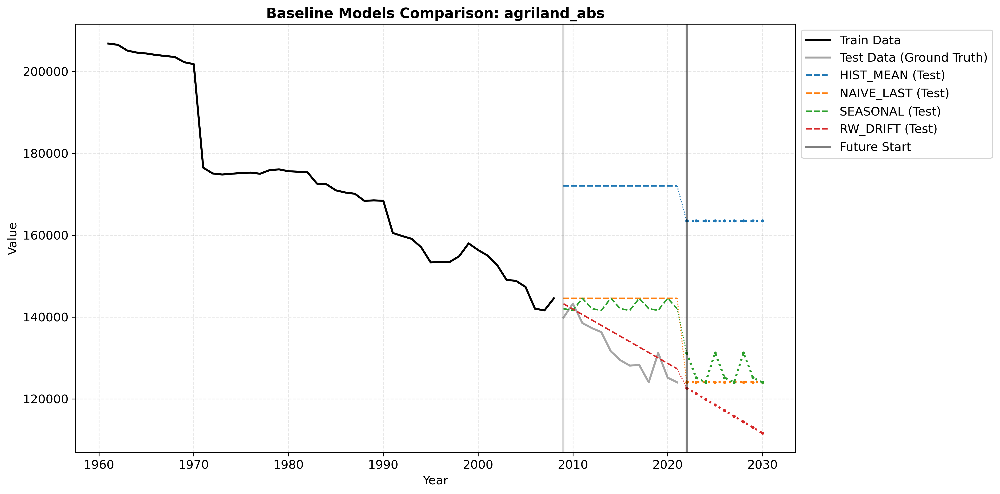


Processing exports_percent...
Saving results for HIST_MEAN | exports_percent...
Save complete.
Saving results for NAIVE_LAST | exports_percent...
Save complete.
Saving results for SEASONAL | exports_percent...
Save complete.
Saving results for RW_DRIFT | exports_percent...
Save complete.


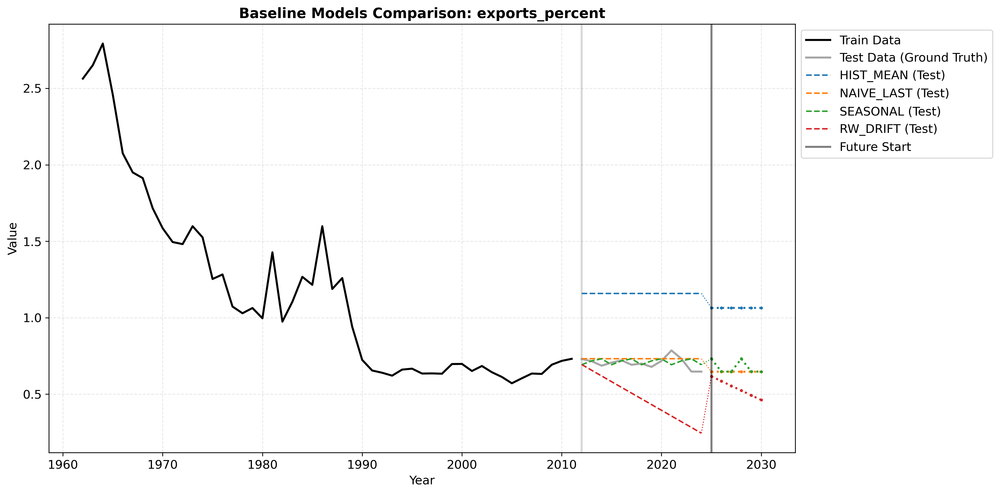


Processing imports_percent...
Saving results for HIST_MEAN | imports_percent...
Save complete.
Saving results for NAIVE_LAST | imports_percent...
Save complete.
Saving results for SEASONAL | imports_percent...
Save complete.
Saving results for RW_DRIFT | imports_percent...
Save complete.


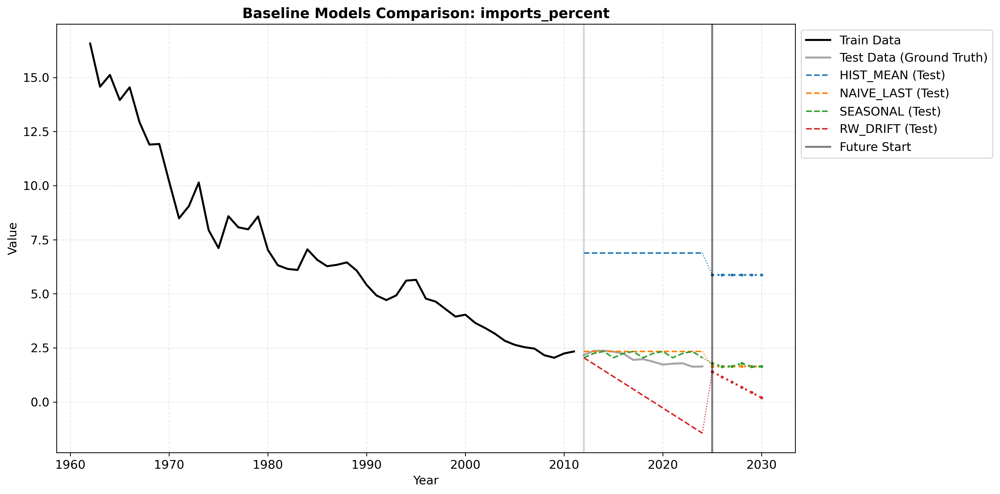


Processing valueadded_percent...
Saving results for HIST_MEAN | valueadded_percent...
Save complete.
Saving results for NAIVE_LAST | valueadded_percent...
Save complete.
Saving results for SEASONAL | valueadded_percent...
Save complete.
Saving results for RW_DRIFT | valueadded_percent...
Save complete.


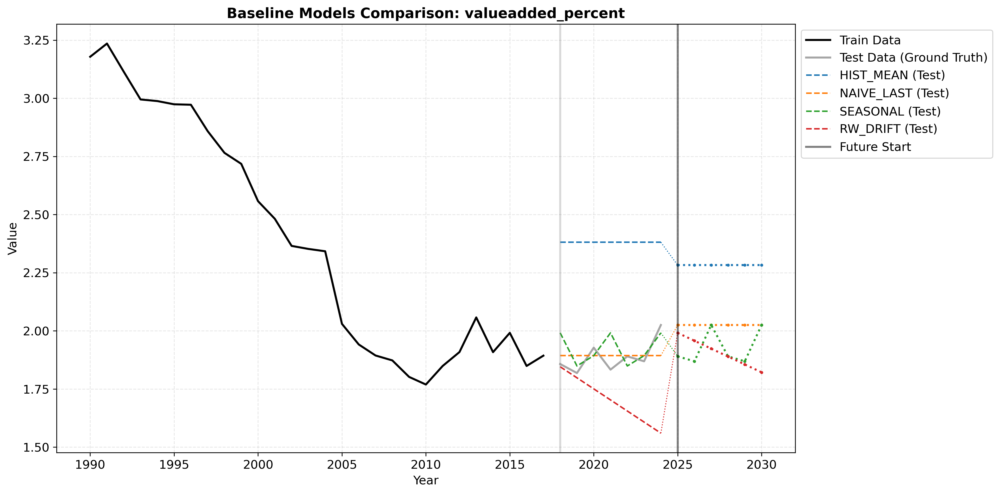


Processing valueadded_dollars...
Saving results for HIST_MEAN | valueadded_dollars...
Save complete.
Saving results for NAIVE_LAST | valueadded_dollars...
Save complete.
Saving results for SEASONAL | valueadded_dollars...
Save complete.
Saving results for RW_DRIFT | valueadded_dollars...
Save complete.


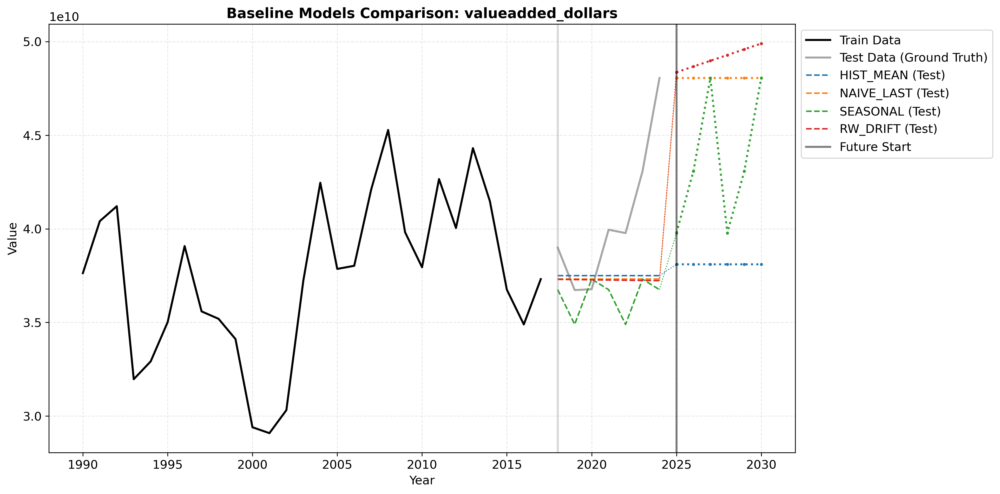


Processing withdrawals_percent...
Saving results for HIST_MEAN | withdrawals_percent...
Save complete.
Saving results for NAIVE_LAST | withdrawals_percent...
Save complete.
Saving results for SEASONAL | withdrawals_percent...
Save complete.
Saving results for RW_DRIFT | withdrawals_percent...
Save complete.


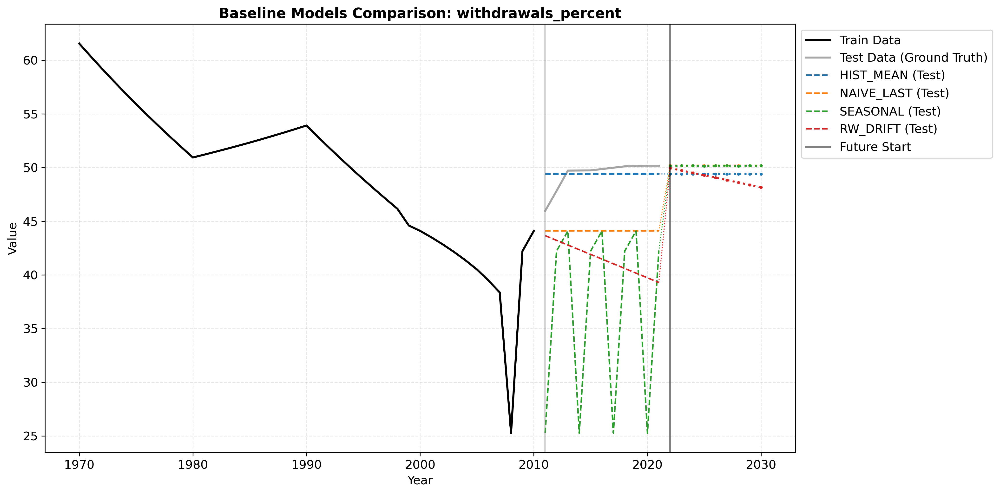


Processing arableland_percent...
Saving results for HIST_MEAN | arableland_percent...
Save complete.
Saving results for NAIVE_LAST | arableland_percent...
Save complete.
Saving results for SEASONAL | arableland_percent...
Save complete.
Saving results for RW_DRIFT | arableland_percent...
Save complete.


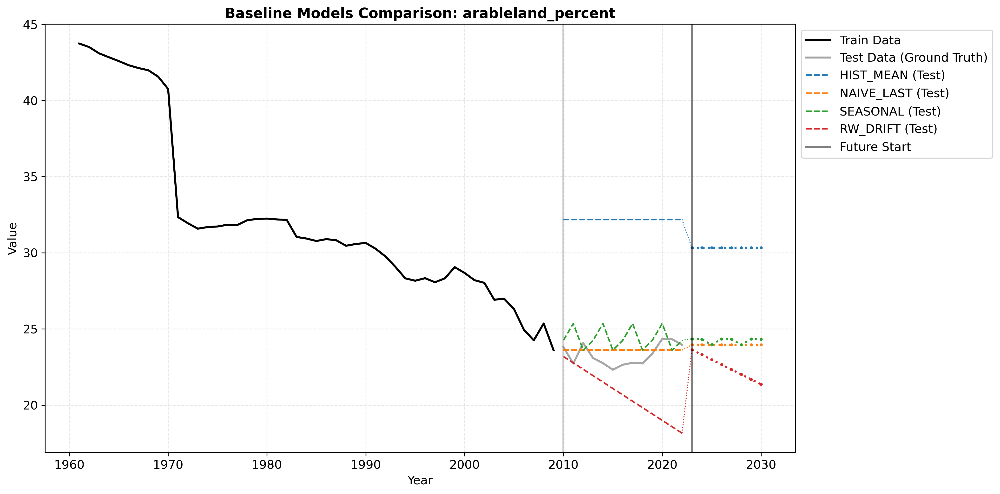


Processing arableland_person...
Saving results for HIST_MEAN | arableland_person...
Save complete.
Saving results for NAIVE_LAST | arableland_person...
Save complete.
Saving results for SEASONAL | arableland_person...
Save complete.
Saving results for RW_DRIFT | arableland_person...
Save complete.


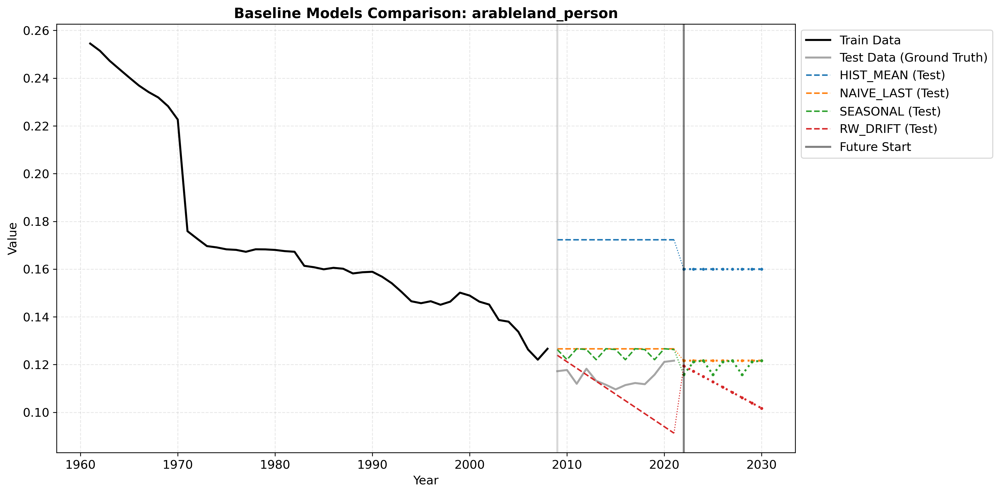


Processing arableland_abs...
Saving results for HIST_MEAN | arableland_abs...
Save complete.
Saving results for NAIVE_LAST | arableland_abs...
Save complete.
Saving results for SEASONAL | arableland_abs...
Save complete.
Saving results for RW_DRIFT | arableland_abs...
Save complete.


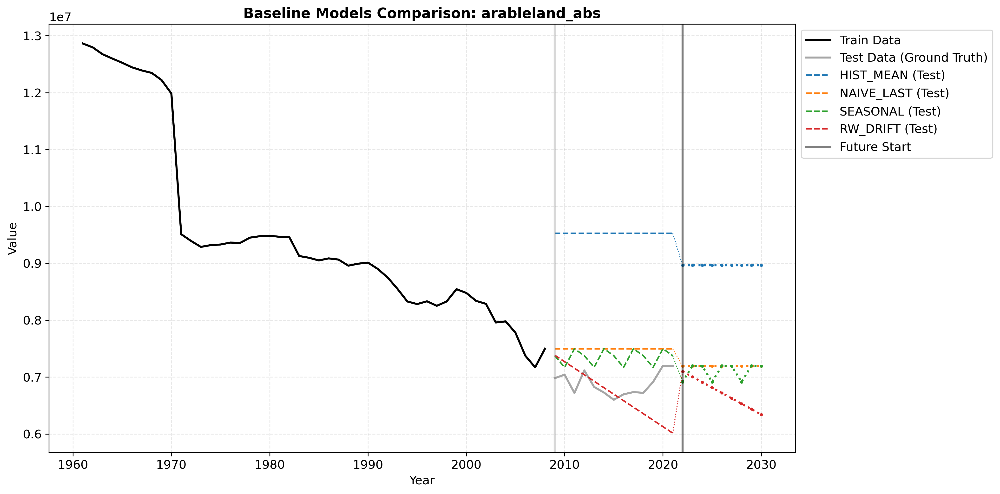


Processing cereal_production...
Saving results for HIST_MEAN | cereal_production...
Save complete.
Saving results for NAIVE_LAST | cereal_production...
Save complete.
Saving results for SEASONAL | cereal_production...
Save complete.
Saving results for RW_DRIFT | cereal_production...
Save complete.


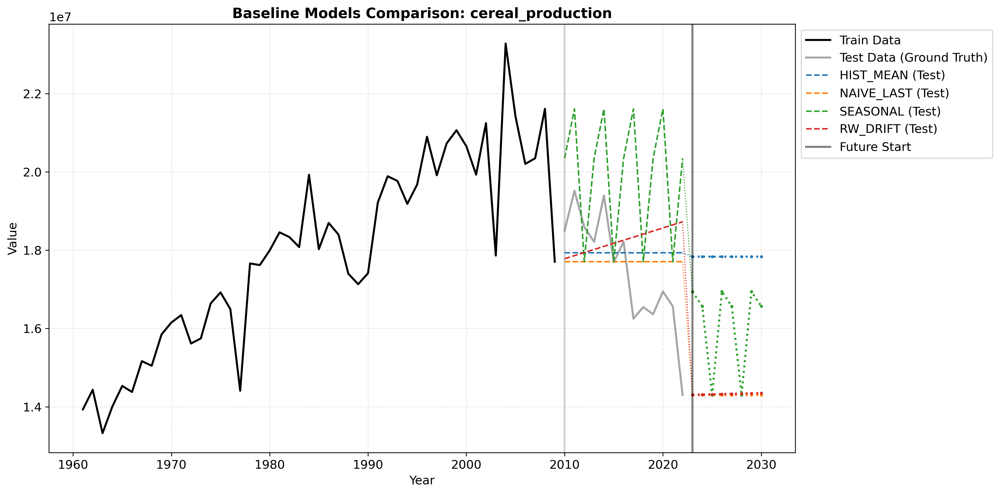


Processing cerealyield_abs...
Saving results for HIST_MEAN | cerealyield_abs...
Save complete.
Saving results for NAIVE_LAST | cerealyield_abs...
Save complete.
Saving results for SEASONAL | cerealyield_abs...
Save complete.
Saving results for RW_DRIFT | cerealyield_abs...
Save complete.


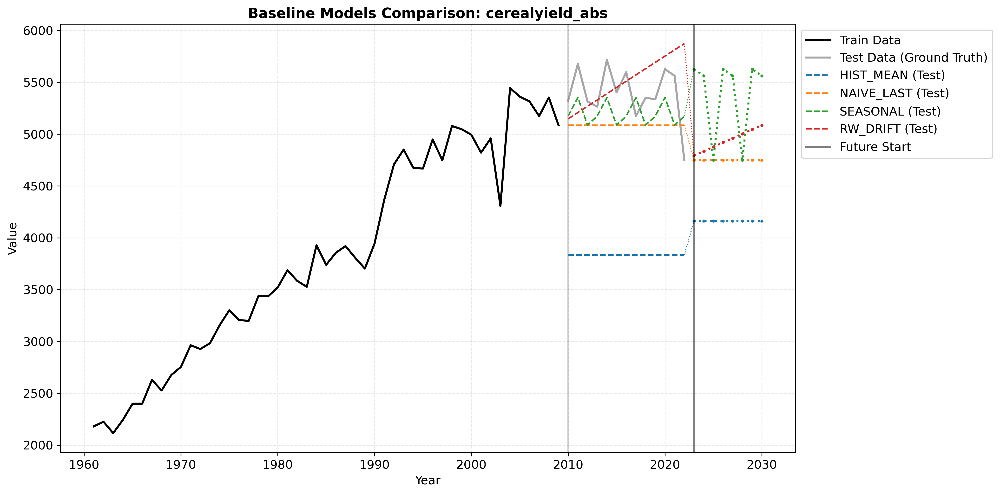


Processing crop_production_index...
Saving results for HIST_MEAN | crop_production_index...
Save complete.
Saving results for NAIVE_LAST | crop_production_index...
Save complete.
Saving results for SEASONAL | crop_production_index...
Save complete.
Saving results for RW_DRIFT | crop_production_index...
Save complete.


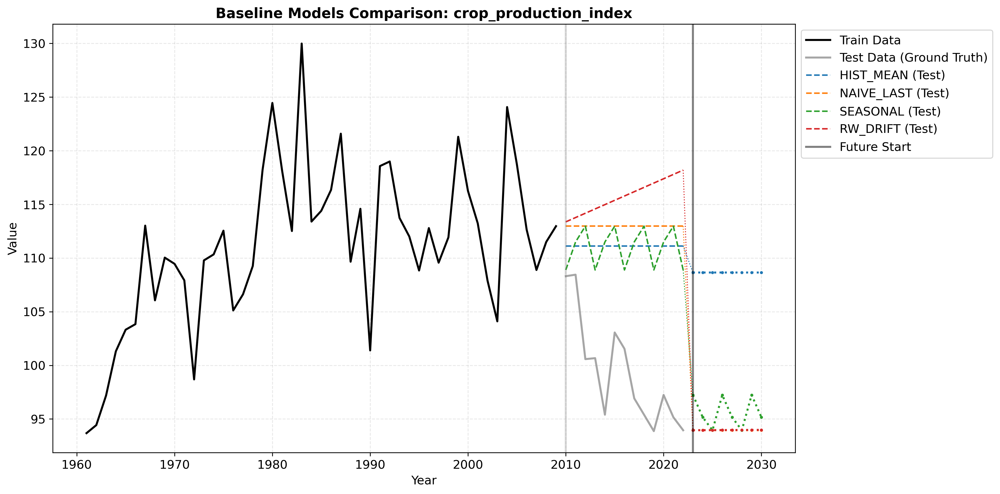


Processing employment_tot...
Saving results for HIST_MEAN | employment_tot...
Save complete.
Saving results for NAIVE_LAST | employment_tot...
Save complete.
Saving results for SEASONAL | employment_tot...
Save complete.
Saving results for RW_DRIFT | employment_tot...
Save complete.


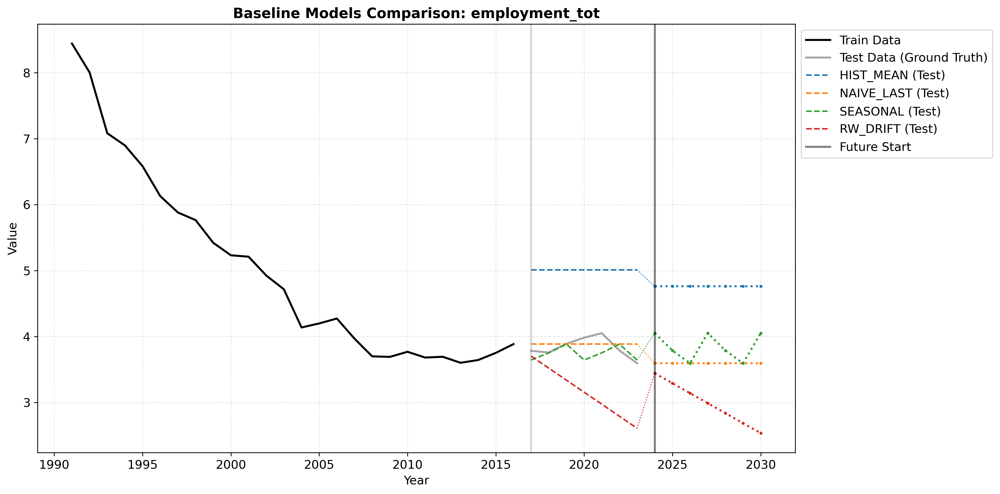


Processing employment_female...
Saving results for HIST_MEAN | employment_female...
Save complete.
Saving results for NAIVE_LAST | employment_female...
Save complete.
Saving results for SEASONAL | employment_female...
Save complete.
Saving results for RW_DRIFT | employment_female...
Save complete.


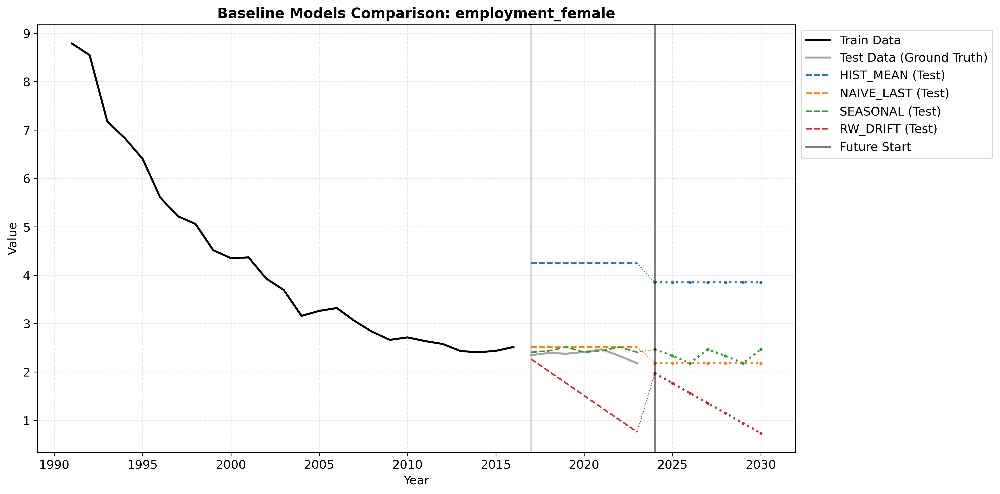


Processing employment_male...
Saving results for HIST_MEAN | employment_male...
Save complete.
Saving results for NAIVE_LAST | employment_male...
Save complete.
Saving results for SEASONAL | employment_male...
Save complete.
Saving results for RW_DRIFT | employment_male...
Save complete.


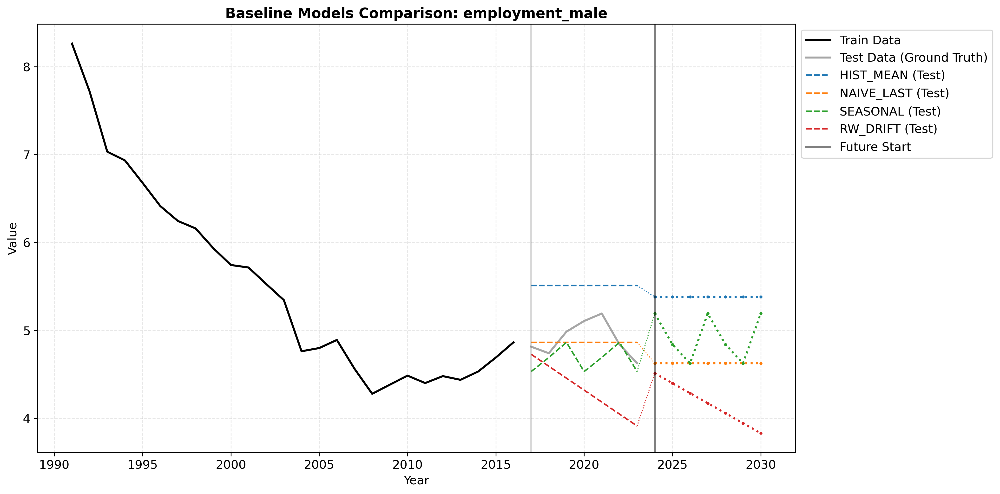


Processing fertilizer_percent...
Saving results for HIST_MEAN | fertilizer_percent...
Save complete.
Saving results for NAIVE_LAST | fertilizer_percent...
Save complete.
Saving results for SEASONAL | fertilizer_percent...
Save complete.
Saving results for RW_DRIFT | fertilizer_percent...
Save complete.


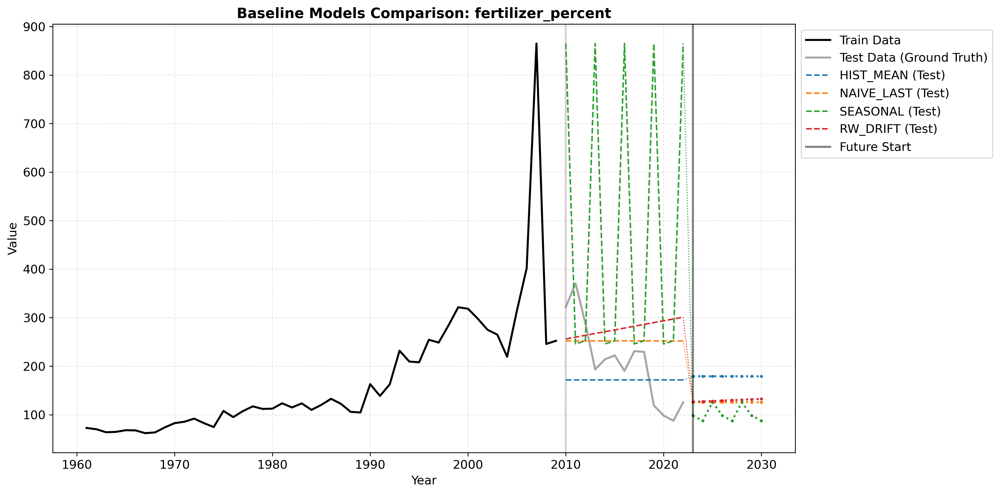


Processing fertilizer_abs...
Saving results for HIST_MEAN | fertilizer_abs...
Save complete.
Saving results for NAIVE_LAST | fertilizer_abs...
Save complete.
Saving results for SEASONAL | fertilizer_abs...
Save complete.
Saving results for RW_DRIFT | fertilizer_abs...
Save complete.


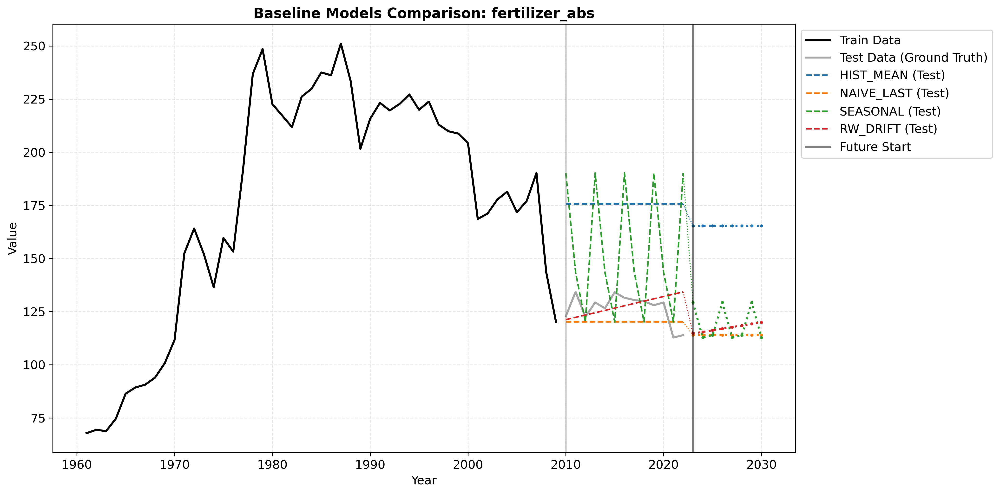


Processing food_production_index...
Saving results for HIST_MEAN | food_production_index...
Save complete.
Saving results for NAIVE_LAST | food_production_index...
Save complete.
Saving results for SEASONAL | food_production_index...
Save complete.
Saving results for RW_DRIFT | food_production_index...
Save complete.


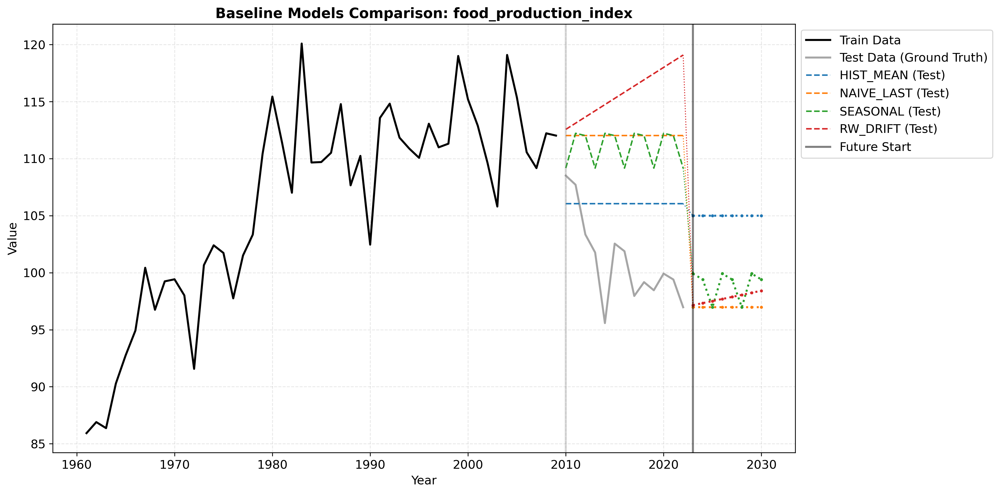


Processing forestarea_percent...
Saving results for HIST_MEAN | forestarea_percent...
Save complete.
Saving results for NAIVE_LAST | forestarea_percent...
Save complete.
Saving results for SEASONAL | forestarea_percent...
Save complete.
Saving results for RW_DRIFT | forestarea_percent...
Save complete.


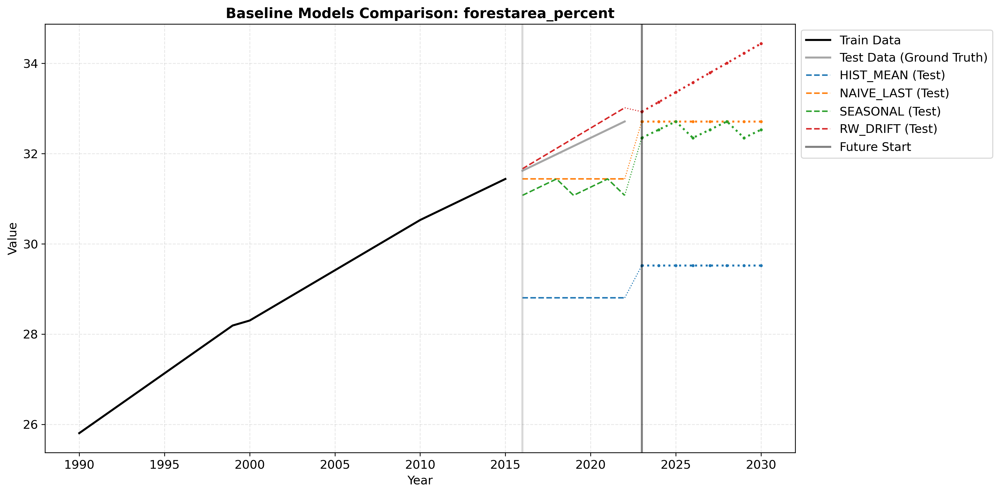


Processing forestarea_abs...
Saving results for HIST_MEAN | forestarea_abs...
Save complete.
Saving results for NAIVE_LAST | forestarea_abs...
Save complete.
Saving results for SEASONAL | forestarea_abs...
Save complete.
Saving results for RW_DRIFT | forestarea_abs...
Save complete.


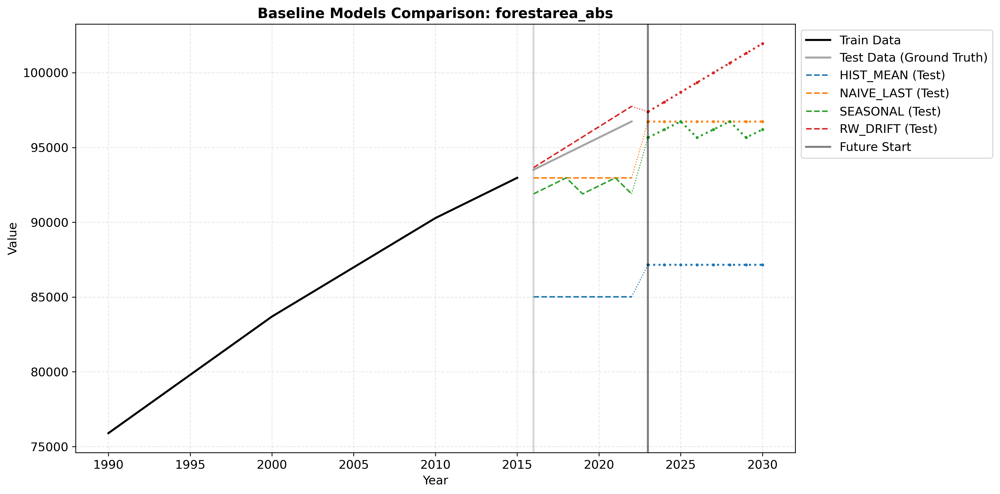


Processing cerealland_abs...
Saving results for HIST_MEAN | cerealland_abs...
Save complete.
Saving results for NAIVE_LAST | cerealland_abs...
Save complete.
Saving results for SEASONAL | cerealland_abs...
Save complete.
Saving results for RW_DRIFT | cerealland_abs...
Save complete.


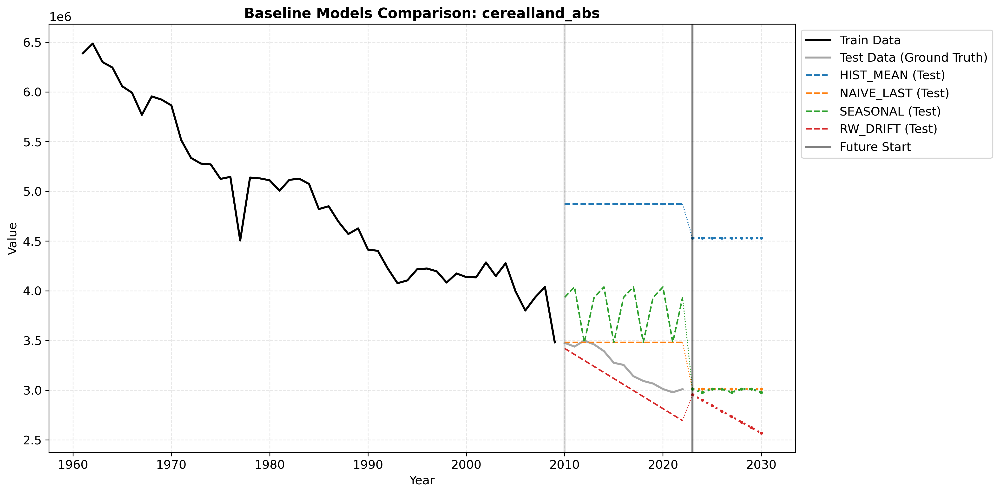


Processing livestock_production_index...
Saving results for HIST_MEAN | livestock_production_index...
Save complete.
Saving results for NAIVE_LAST | livestock_production_index...
Save complete.
Saving results for SEASONAL | livestock_production_index...
Save complete.
Saving results for RW_DRIFT | livestock_production_index...
Save complete.


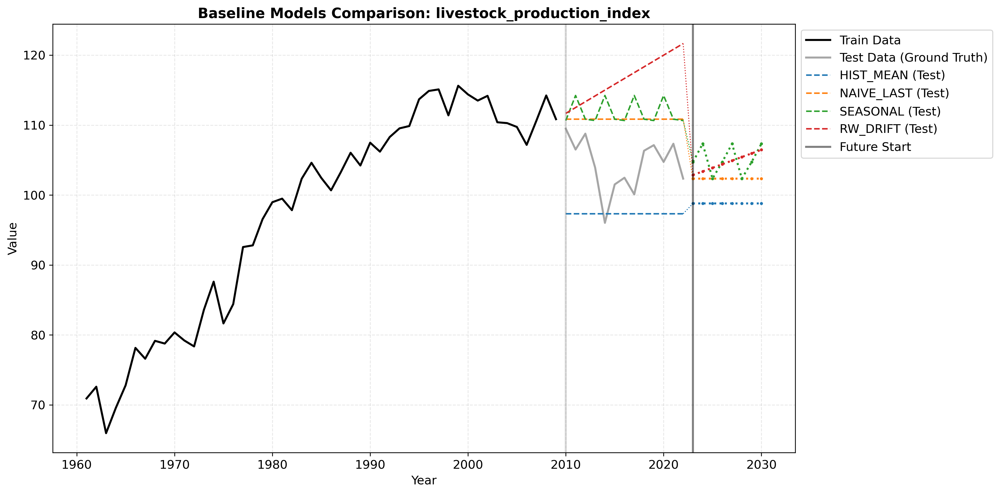


Processing cropland_percent...
Saving results for HIST_MEAN | cropland_percent...
Save complete.
Saving results for NAIVE_LAST | cropland_percent...
Save complete.
Saving results for SEASONAL | cropland_percent...
Save complete.
Saving results for RW_DRIFT | cropland_percent...
Save complete.


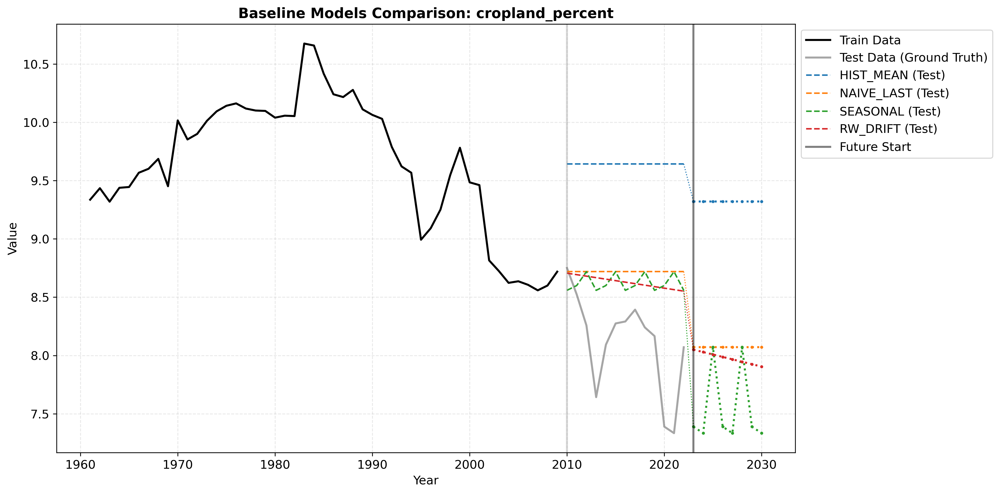


Processing population_abs...
Saving results for HIST_MEAN | population_abs...
Save complete.
Saving results for NAIVE_LAST | population_abs...
Save complete.
Saving results for SEASONAL | population_abs...
Save complete.
Saving results for RW_DRIFT | population_abs...
Save complete.


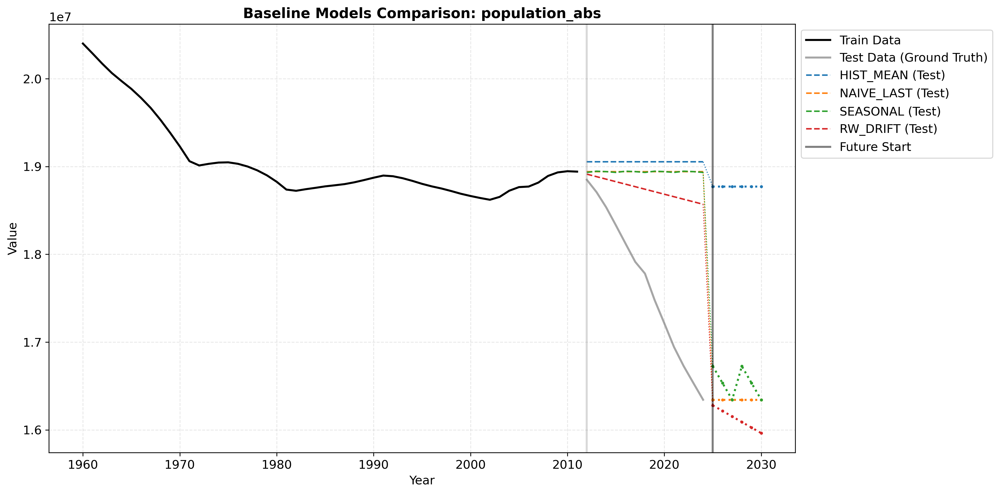


Processing population_percent...
Saving results for HIST_MEAN | population_percent...
Save complete.
Saving results for NAIVE_LAST | population_percent...
Save complete.
Saving results for SEASONAL | population_percent...
Save complete.
Saving results for RW_DRIFT | population_percent...
Save complete.


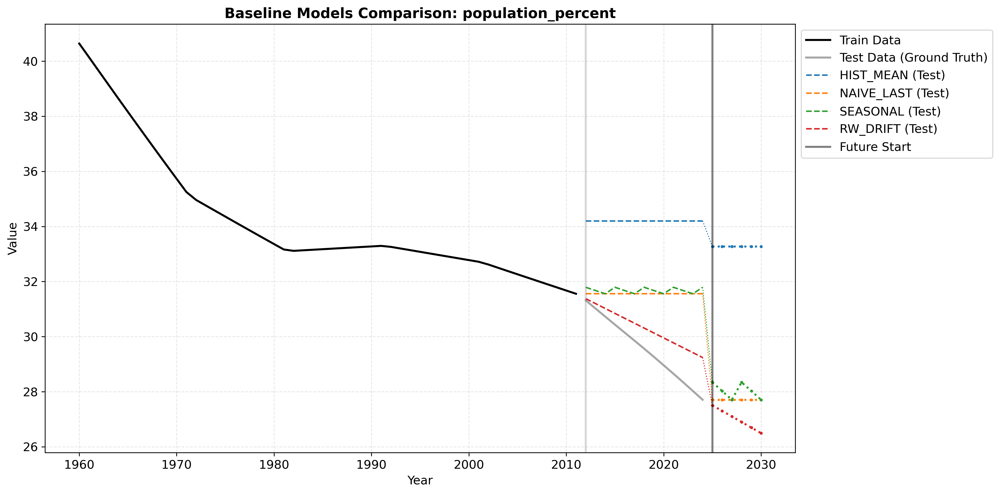


Processing population_growth...
Saving results for HIST_MEAN | population_growth...
Save complete.
Saving results for NAIVE_LAST | population_growth...
Save complete.
Saving results for SEASONAL | population_growth...
Save complete.
Saving results for RW_DRIFT | population_growth...
Save complete.


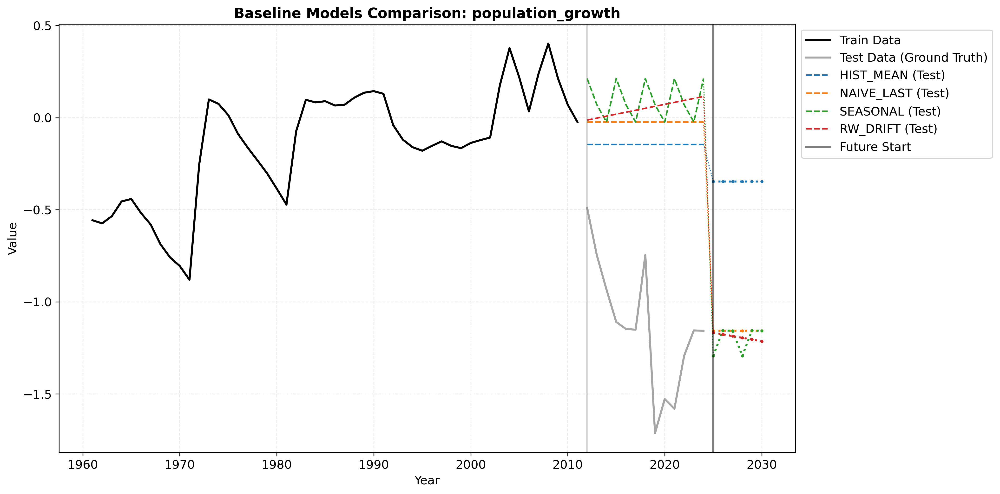

In [9]:
TARGET_YEAR = 2030

# Definiamo i modelli da confrontare
# Nota: Seasonal Naive ha senso solo se hai stagionalità. 
# Se i dati sono annuali, Seasonal Naive(period=1) == Last Value. Quindi lo rimuovo se ridondante.
MODELS = {
    "HIST_MEAN": mod.predict_historical_mean,
    "NAIVE_LAST": mod.predict_random_walk,
    "SEASONAL": mod.predict_seasonal_naive,
    "RW_DRIFT": mod.predict_random_walk_drift
}

# --- MAIN LOOP ---
for col in df.columns:
    if not np.issubdtype(df[col].dtype, np.number): continue
    if df[col].dropna().empty: continue
    
    print(f"\nProcessing {col}...")
    
    series = df[col].dropna()
    train, test = pipe.split_train_test(df, col) 

    last_year = series.index.max().year
    future_years = list(range(last_year + 1, TARGET_YEAR + 1))
    
    # Dizionario per raccogliere predizioni e passarle al plotter
    # Struttura: { 'NomeModello': (series_test, series_future) }
    plot_data_collection = {}

    # 2. Loop su ogni Modello Baseline
    for model_name, model_func in MODELS.items():
        start_time = time.time()
        
        # A. Predizione Test
        pred_test = model_func(train, test.index)
        
        # B. Predizione Futuro (Usando tutta la storia)
        pred_future = model_func(series, future_years)
        future_df = pd.DataFrame({'year': future_years, 'pred': pred_future.values})
        
        elapsed_time = time.time() - start_time
        
        # C. Salvataggio Excel (Uno per uno, così il file si popola)
        rep.save_experiment_results(
            indicator=col,
            model_name=model_name,
            configuration="baseline",
            y_test=test['Value'].values,
            y_pred=pred_test.values,
            years_test=test.index.year.tolist(),
            y_train=train['Value'].values,
            params=None,
            training_time=elapsed_time,
            future_predictions=future_df
        )
        
        # D. Salviamo i dati per il grafico finale
        plot_data_collection[model_name] = (pred_test, pred_future)

    # 3. Generazione Grafico Comparativo (Uno per Indicatore)
    visual.plot_baseline_comparison(
        train=train,
        test=test,
        future_years=future_years,
        predictions_dict=plot_data_collection,
        variable_name=col,
        save_plot=True
    )

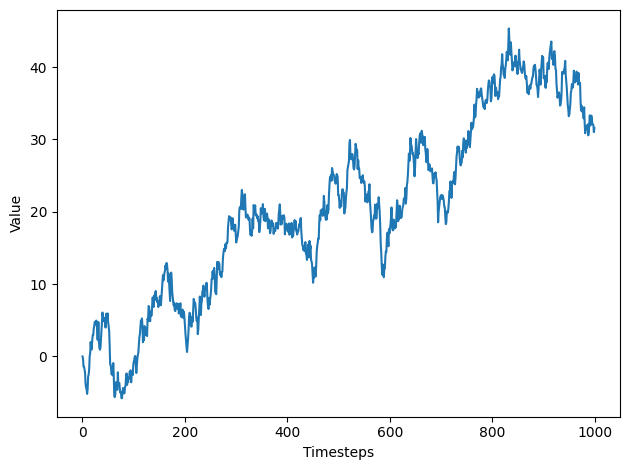

In [8]:
np.random.seed(9)
steps = np.random.standard_normal(1000)
steps[0] = 0
random_walk = np.cumsum(steps)

fig, ax = plt.subplots()
ax.plot(random_walk)
ax.set_xlabel('Timesteps')
ax.set_ylabel('Value')
plt.tight_layout()

mean 57    102.963333
58    104.516667
59    106.063333
60    106.396667
61    104.800000
Name: Value, dtype: float64
variance 57     9.916933
58    14.856533
59     1.493333
60     2.093333
61     6.228700
Name: Value, dtype: float64
Serie non stazionaria (p-value: 0.064)


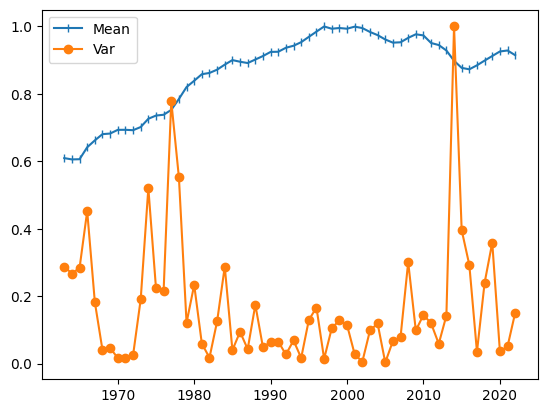

In [9]:
# TESTING FOR STATIONARITY
def is_stationary(df_livestock):
    values = df_livestock['Value']
    rolling_mean = values.rolling(3).mean()
    rolling_var = values.rolling(3).var()
    print("mean", rolling_mean.tail())
    print("variance", rolling_var.tail())
    ADF_result = adfuller(values)
    if (ADF_result[1] < 0.05):
        print(f"Serie stazionaria (p-value: {ADF_result[1]:.2})")
    else: print(f"Serie non stazionaria (p-value: {ADF_result[1]:.2})")
    fig, ax = plt.subplots()
    ax.plot(df_livestock['Year'], rolling_mean/rolling_mean.max(), marker='|', label='Mean')
    ax.plot(df_livestock['Year'], rolling_var/rolling_var.max(), marker = 'o', label='Var')    
    ax.legend(loc=2)
is_stationary(df_livestock)

   Year  Value  Diff
0  1961  70.91   NaN
1  1962  72.59  1.68
2  1963  65.95 -6.64
3  1964  69.57  3.62
4  1965  72.80  3.23
ADF statistic: -4.045587586051285
p-value: 0.001189740551875537


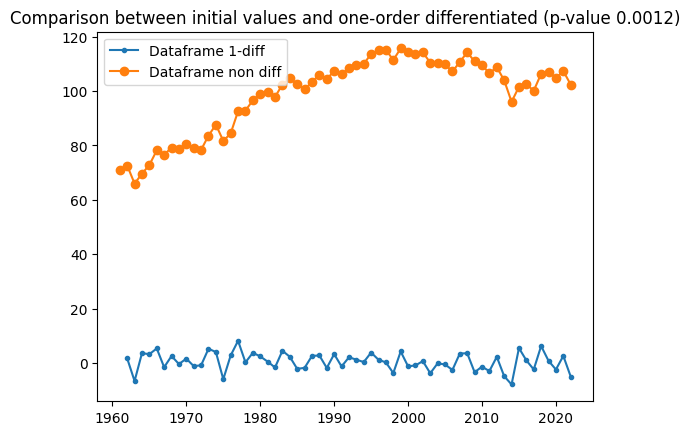

In [10]:
# prima differenziazione per fare in modo che rimanga costante nel tempo = diventi stazionaria
df_livestock['Diff'] = df_livestock['Value'].diff()
print(df_livestock.head())

ADF_result = adfuller(df_livestock['Diff'].dropna())
print("ADF statistic:", ADF_result[0])
print("p-value:", ADF_result[1])

# plot
fig, ax = plt.subplots()
ax.plot(df_livestock['Year'], df_livestock['Diff'], label='Dataframe 1-diff', marker='.')
ax.plot(df_livestock['Year'], df_livestock['Value'], label='Dataframe non diff', marker='o')
ax.set_title(f"Comparison between initial values and one-order differentiated (p-value {ADF_result[1]:.2})") 
ax.legend(loc=2)

ADF Statistic prima di differenziazione: -2.764199820687294
p-value prima di differenziazione: 0.0635723285140925


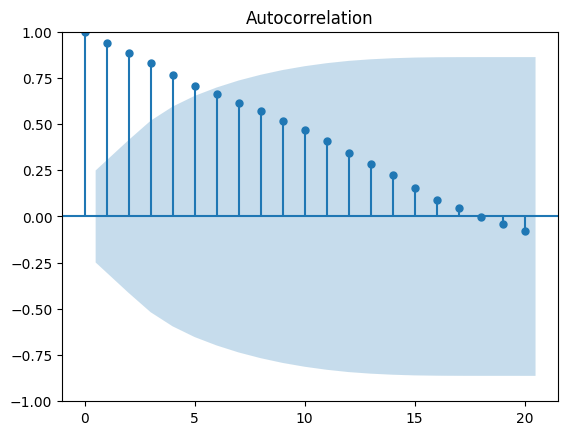

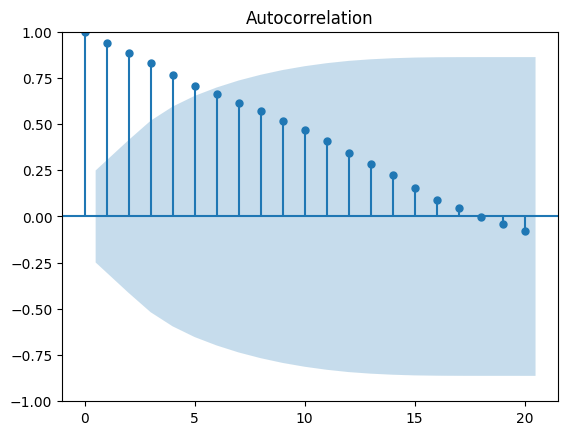

In [11]:
ADF_result = adfuller(df_livestock['Value'])
print(f'ADF Statistic prima di differenziazione: {ADF_result[0]}')
print(f'p-value prima di differenziazione: {ADF_result[1]}')
plot_acf(df_livestock['Value'], lags=20)

1    1.68
2   -6.64
3    3.62
4    3.23
5    5.34
Name: Diff, dtype: float64
ADF Statistic dopo differenziazione: -4.045587586051285
p-value dopo differenziazione: 0.001189740551875537


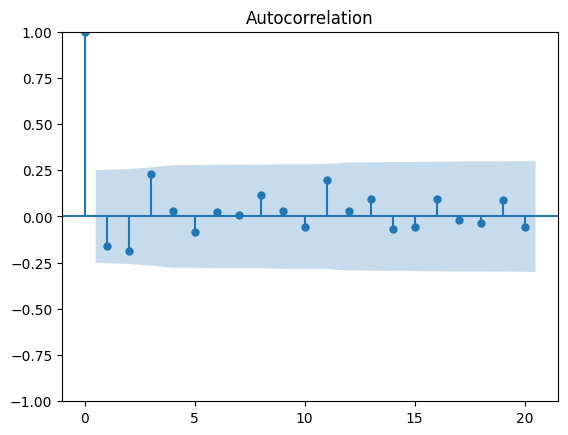

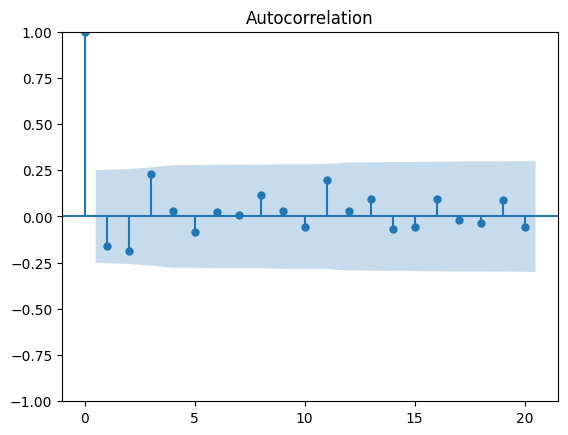

In [12]:
diff_values = df_livestock['Diff'].dropna()
print(diff_values.head())

ADF_result = adfuller(diff_values)
print(f'ADF Statistic dopo differenziazione: {ADF_result[0]}')
print(f'p-value dopo differenziazione: {ADF_result[1]}')

plot_acf(diff_values, lags=20)

Text(0, 0.5, 'Value')

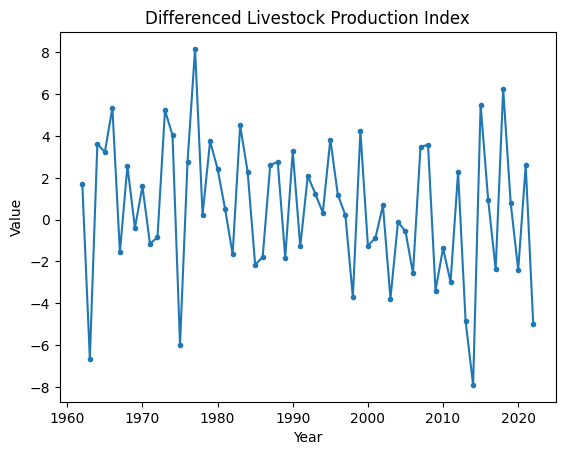

In [13]:
fig, ax = plt.subplots()
ax.plot(df_livestock['Year'], df_livestock['Diff'], marker='.')
ax.set_title("Differenced Livestock Production Index")
ax.set_xlabel("Year")
ax.set_ylabel("Value")

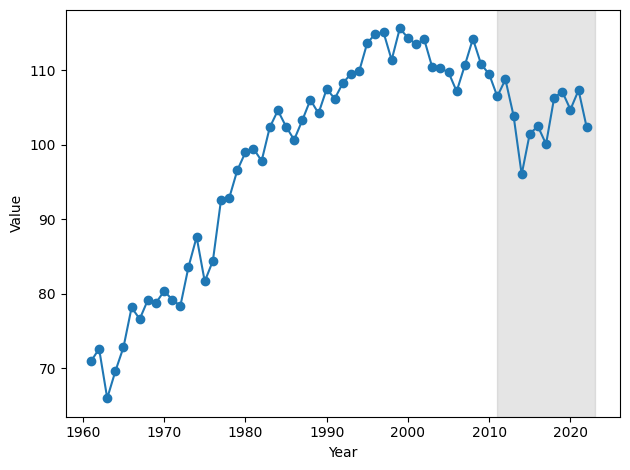

In [14]:
train = df_livestock[:50]
test = df_livestock[50:]
fig, ax = plt.subplots()

ax.plot(df_livestock['Year'], df_livestock['Value'], marker="o", linestyle="-")
ax.set_xlabel('Year')
ax.set_ylabel('Value')
ax.axvspan(2011, 2023, color='#808080', alpha=0.2)

plt.tight_layout()

In [15]:
mean = np.mean(train['Value'])
test['pred_mean'] = mean

first_value = train.iloc[0]['Value']
last_value = train.iloc[-1]['Value']

test['pred_last'] = last_value

deltaY = last_value - first_value     # ultimo valore - primo valore
deltaX = len(train)-1                 # numero valutazioni nel training set - 1
drift = deltaY / deltaX

x_vals = np.arange(1, len(test) + 1)
pred_drift = drift * x_vals + first_value
test['pred_drift'] = pred_drift
test.head()
test.copy()

C:\Users\oldan\AppData\Local\Temp\ipykernel_1460\1162790020.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['pred_mean'] = mean
C:\Users\oldan\AppData\Local\Temp\ipykernel_1460\1162790020.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['pred_last'] = last_value
C:\Users\oldan\AppData\Local\Temp\ipykernel_1460\1162790020.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats 

,Year,Value,Diff,pred_mean,pred_last,pred_drift
50,2011,106.50,-2.98,97.565,109.48,71.697143
51,2012,108.77,2.27,97.565,109.48,72.484286
52,2013,103.92,-4.85,97.565,109.48,73.271429
53,2014,96.02,-7.90,97.565,109.48,74.058571
54,2015,101.51,5.49,97.565,109.48,74.845714
55,2016,102.47,0.96,97.565,109.48,75.632857
56,2017,100.09,-2.38,97.565,109.48,76.420000
57,2018,106.33,6.24,97.565,109.48,77.207143
58,2019,107.13,0.80,97.565,109.48,77.994286
59,2020,104.73,-2.40,97.565,109.48,78.781429


In [16]:
import statsmodels.api as sm
t = np.arange(len(train))  # 0,1,2,...
X = sm.add_constant(t)
y = train['Value'].values
model = sm.OLS(y, X).fit()
slope = model.params[1]
print(model.summary())  # vedi p-value, conf_int, R^2

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.871
Model:                            OLS   Adj. R-squared:                  0.868
Method:                 Least Squares   F-statistic:                     322.9
Date:                Wed, 26 Nov 2025   Prob (F-statistic):           5.98e-23
Time:                        10:29:40   Log-Likelihood:                -155.54
No. Observations:                  50   AIC:                             315.1
Df Residuals:                      48   BIC:                             318.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         73.6592      1.544     47.705      0.0

colonne Index(['Year', 'Value', 'Diff', 'pred_mean', 'pred_last', 'pred_drift'], dtype='object')


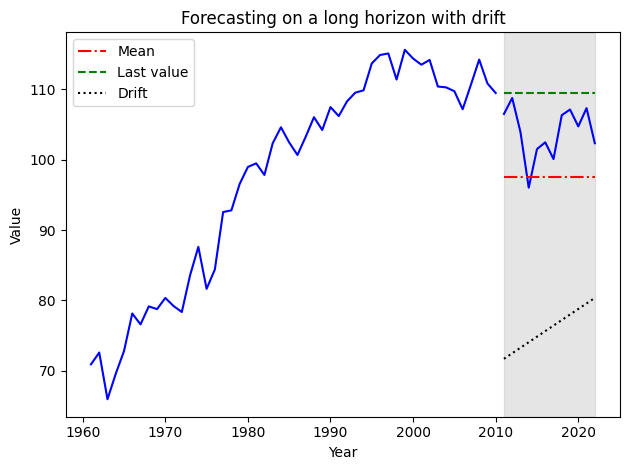

In [17]:
fig, ax = plt.subplots()
print("colonne", test.columns)

ax.plot(train['Year'], train['Value'], 'b-')
ax.plot(test['Year'], test['Value'], 'b-')
ax.plot(test['Year'], test['pred_mean'], 'r-.', label='Mean')
ax.plot(test['Year'], test['pred_last'], 'g--', label='Last value')
ax.plot(test['Year'], test['pred_drift'], 'k:', label='Drift')

ax.axvspan(2011, 2022, color='#808080', alpha=0.2)
ax.legend(loc=2)

ax.set_xlabel('Year')
ax.set_ylabel('Value')
ax.set_title('Forecasting on a long horizon with drift')

plt.tight_layout()

mi sa che questo grafico sopra è sbagliato, il drift dovrebbe stare più in alto, iniziare dall'ultimo punto del training set, non so